In [116]:
!pip install -q -U segmentation_models_pytorch
!pip install rasterio --quiet

In [117]:
import os
import pandas as pd
import numpy as np
import math

import torch
from torch import nn
import torch.nn.functional as F
from torchvision import transforms

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.dataset import random_split

from osgeo import gdal, ogr, osr
import rasterio
from rasterio.plot import show

from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import segmentation_models_pytorch as smp

In [118]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [119]:
class CFG1:
    encoder = 'se_resnext50_32x4d'
    encoder_weights = 'imagenet'
    batch_size = 4
    num_epochs = 15
    lr = 1e-4
    seed = 0
    dataset_path = "/content/drive/MyDrive/Dataset3/sampling.csv"
    save_path = "/content/drive/MyDrive/Dataset3/model"
    imerg_path = "/content/drive/MyDrive/Dataset3/imerg.csv"

In [120]:
def seed_everything(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available(): 
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True

seed_everything(CFG1.seed)

In [121]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [122]:
df = pd.read_csv(CFG1.dataset_path, skiprows=[249], index_col=0)

In [123]:
df.head()

,TCWV,radar,CAPE,TCC,TCW,ISOR,B09B,B10B,B16B,B11B,B12B,B14B,I2B,I4B,WVB,IRB
0,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...
1,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...
2,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...
3,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...
4,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive

In [124]:
class RainDataset(Dataset):
    def __init__(self, df):
        self.df = df
        self.train_col = ["ISOR", "CAPE", "TCWV", "TCC", "TCW", "IRB",
                            "B10B", "B16B", "B11B", "I2B", "WVB", "B09B"]

        self.img = self.df[self.train_col]

        self.gt = self.df["radar"]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        raw_input = []
        input = []

        for j in range(len(self.img.iloc[i])):
            raw_input.append(self.read_image(self.img.iloc[i][j]))
        
        for j in range(5):
          input.append(raw_input[j])

        input.append(raw_input[self.train_col.index("IRB")])
        input.append(np.subtract(raw_input[self.train_col.index("B10B")], raw_input[self.train_col.index("B16B")]))
        input.append(np.subtract(raw_input[self.train_col.index("B11B")], raw_input[self.train_col.index("IRB")]))
        input.append(np.subtract(raw_input[self.train_col.index("IRB")], raw_input[self.train_col.index("I2B")]))
        input.append(np.subtract(raw_input[self.train_col.index("WVB")], raw_input[self.train_col.index("B09B")]))
        input.append(np.subtract(raw_input[self.train_col.index("B09B")], raw_input[self.train_col.index("B10B")]))
        
        input = torch.from_numpy(np.concatenate(input, axis=0))
        gt = torch.from_numpy(self.read_image(self.gt.iloc[i]))
        
        return input, gt

    def read_image(self, path):
        img = gdal.Open(path)
        img_arr = img.GetRasterBand(1).ReadAsArray()
        return img_arr.reshape(-1, 512, 512)

In [125]:
dataset = RainDataset(df)

In [126]:
def split_train_val_test(dataset, val_ratio=0.1, test_ratio=0.2):
    test_length = int(len(dataset) * test_ratio)
    val_length = int(len(dataset) * val_ratio)
    train_length = len(dataset) - val_length - test_length
    return random_split(
        dataset, lengths=[train_length, val_length, test_length]
    )

train_ds, val_ds, test_ds = split_train_val_test(dataset)

In [127]:
test_loader = DataLoader(test_ds, batch_size=CFG1.batch_size, shuffle=False, num_workers=2)

In [128]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [129]:
class ResidualAttentionUNet(nn.Module):
  def __init__(self, inputChannel=11, outputChannel=1):
    super().__init__()
    self.downsample1 = DownSampleWithAttention(inputChannel, 32)
    self.downsample2 = DownSampleWithAttention(32, 64)
    self.downsample3 = DownSampleWithAttention(64, 128)
    self.downsample4 = DownSampleWithAttention(128, 256)
    self.downsample5 = DownSampleWithAttention(256, 512)

    self.residualBlock1 = ResidualBlock(512, 512)
    self.residualBlock2 = ResidualBlock(512, 512)
    self.residualBlock3 = ResidualBlock(512, 512)

    self.upsample1 = UpSampleWithAttention(512, 256)
    self.upsample2 = UpSampleWithAttention(512, 128)
    self.upsample3 = UpSampleWithAttention(256, 64)
    self.upsample4 = UpSampleWithAttention(128, 32)
    self.upsample5 = UpSampleWithAttention(64, 32)
    self.classification = nn.Sequential(
            nn.Conv2d(32, outputChannel, kernel_size=1),
        )

  def forward(self, x):
    scale128, sa128down = self.downsample1(x)
    scale64, sa64down = self.downsample2(scale128)
    scale32, sa32down = self.downsample3(scale64)
    scale16, sa64down = self.downsample4(scale32)
    scale8, sa8down = self.downsample5(scale16)
    scale8, sa8down = self.residualBlock1(scale8)
    scale8, sa8down = self.residualBlock2(scale8)
    scale8, sa8down = self.residualBlock3(scale8)
    upscale16, sa16up = self.upsample1(scale8)
    upscale16 = torch.cat([upscale16, scale16], dim=1)
    upscale32, sa32up = self.upsample2(upscale16)
    upscale32 = torch.cat([upscale32, scale32], dim=1)
    upscale64, sa64up = self.upsample3(upscale32)
    upscale64 = torch.cat([upscale64, scale64], dim=1)
    upscale128, sa128up = self.upsample4(upscale64)
    upscale128 = torch.cat([upscale128, scale128], dim=1)
    upscale256, sa256up = self.upsample5(upscale128)
    finaloutput = self.classification(upscale256)
    return finaloutput

class DownSampleWithAttention(nn.Module):
    def __init__(self, inputChannel, outputChannel):
        super().__init__()
        self.convolution = nn.Sequential(
            nn.Conv2d(inputChannel, outputChannel, kernel_size=3, padding=1),
            nn.BatchNorm2d(outputChannel),
            nn.LeakyReLU(0.2),
            nn.Conv2d(outputChannel, outputChannel, kernel_size=3, padding=1),
            nn.BatchNorm2d(outputChannel),
            nn.LeakyReLU(0.2),
            nn.AvgPool2d(2)
        )
        self.ca = ChannelAttention(outputChannel)
        self.sa = SpatialAttention()
    
    def forward(self,x):
        x = self.convolution(x)
        caOutput = self.ca(x)
        x = caOutput * x
        saOutput = self.sa(x)
        x = saOutput * x
        return x, saOutput

class ResidualBlock(nn.Module):
    def __init__(self, inputChannel, outputChannel, stride=1, downsample=None):
        super(ResidualBlock, self).__init__()
        self.conv1 = conv3x3(inputChannel, outputChannel, stride)
        self.bn1 = nn.BatchNorm2d(outputChannel)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(outputChannel, outputChannel)
        self.bn2 = nn.BatchNorm2d(outputChannel)
        self.downsample = downsample
        self.ca = ChannelAttention(outputChannel)
        self.sa = SpatialAttention()
        
    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        if self.downsample:
            residual = self.downsample(x)
        out += residual
        out = self.relu(out)
        caOutput = self.ca(out)
        out = caOutput * out
        saOutput = self.sa(out)
        out = saOutput * out
        return out, saOutput

class UpSampleWithAttention(nn.Module):
    def __init__(self, inputChannel, outputChannel):
        super().__init__()
        self.convolution = nn.Sequential(
            nn.Conv2d(inputChannel, outputChannel, kernel_size=3, padding=1),
            nn.BatchNorm2d(outputChannel),
            nn.LeakyReLU(0.2),
            nn.Conv2d(outputChannel, outputChannel, kernel_size=3, padding=1),
            nn.BatchNorm2d(outputChannel),
            nn.LeakyReLU(0.2)
        )
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.ca = ChannelAttention(outputChannel)
        self.sa = SpatialAttention()
    
    def forward(self, x):
        x = self.upsample(x)
        x = self.convolution(x)
        caOutput = self.ca(x)
        x = caOutput * x
        saOutput = self.sa(x)
        x = saOutput * x
        return x, saOutput

class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
           
        self.fc = nn.Sequential(nn.Conv2d(in_planes, in_planes // 16, 1, bias=False),
                               nn.ReLU(),
                               nn.Conv2d(in_planes // 16, in_planes, 1, bias=False))
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        out = avg_out + max_out
        return self.sigmoid(out)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=kernel_size//2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

def conv3x3(in_planes, out_planes, stride=1):
    "3x3 convolution with padding"
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)

In [130]:
def test(model, criterion, test_loader):
    test_loss = 0
    gts, preds = [], []
    
    model.eval()
    for image, gt in tqdm(test_loader, leave=False):
        image, gt = image.to(device), gt.to(device)

        with torch.no_grad():
            predict = model(image)
            mask = gt >= 0
            gts.append(gt)
            preds.append(predict)
            predict = predict[mask]
            gt = gt[mask]
            loss = criterion(predict, gt)
            test_loss += loss.item()

    return test_loss / len(test_loader), preds, gts

In [131]:
def array2raster(newRasterfn, rasterOrigin, pixelWidth, pixelHeight, array):

    cols = array.shape[1]
    rows = array.shape[0]
    originX = rasterOrigin[0]
    originY = rasterOrigin[1]

    driver = gdal.GetDriverByName('GTiff')
    outRaster = driver.Create(newRasterfn, cols, rows, 1, gdal.GDT_Byte)
    outRaster.SetGeoTransform((originX, pixelWidth, 0, originY, 0, pixelHeight))
    outband = outRaster.GetRasterBand(1)
    outband.WriteArray(array)
    outRasterSRS = osr.SpatialReference()
    outRasterSRS.ImportFromEPSG(4326)
    outRaster.SetProjection(outRasterSRS.ExportToWkt())
    outband.FlushCache()

In [132]:
def plot(target_path, imerg_path, pred_se_path, pred_resattn_path, pred_ensemble_path):
  target = rasterio.open(target_path)
  imerg = rasterio.open(imerg_path)
  pred_se = rasterio.open(pred_se_path)
  pred_resattn = rasterio.open(pred_resattn_path)
  pred_ensemble = rasterio.open(pred_ensemble_path)

  fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(30,10))
  show(target, ax=ax1, title='Target')
  show(imerg, ax=ax2, title='IMERG')
  show(pred_se, ax=ax3, title='SE-ResNeXt U-Net')
  show(pred_resattn, ax=ax4, title='ResAtt U-Net')
  show(pred_ensemble, ax=ax5, title='Ensemble')
  plt.show()

In [133]:
model1 = smp.Unet(encoder_name=CFG1.encoder,
                 encoder_weights=CFG1.encoder_weights,
                 in_channels=11,
                 encoder_depth=5,
                 classes=1)

model1.to(device)

Unet(
  (encoder): SENetEncoder(
    (layer0): Sequential(
      (conv1): Conv2d(11, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (pool): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    )
    (layer1): Sequential(
      (0): SEResNeXtBottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

In [134]:
criterion = nn.MSELoss()

In [135]:
from sklearn.metrics import mean_absolute_error, r2_score
from scipy import stats

In [136]:
state_dict1 = torch.load(f'{CFG1.save_path}/{CFG1.encoder}-{CFG1.seed}.pth')
model1.load_state_dict(state_dict1)

test_loss1, pred1, target = test(model1, criterion, test_loader)

pred1_np = torch.cat(pred1, axis=0).cpu().permute(0, 2, 3, 1).reshape(-1, 1).numpy()
target_np = torch.cat(target, axis=0).cpu().permute(0, 2, 3, 1).reshape(-1, 1).numpy()

mask = target_np >= 0
predict = pred1_np[mask]
gt = target_np[mask]

print(f"Test MSE: {format(test_loss1, '.4f')}")
print(f"Test RMSE: {format(math.sqrt(test_loss1), '.4f')}")
print(f"Test MAE: {format(mean_absolute_error(predict, gt), '.4f')}")
print(f"Test R2: {format(r2_score(predict, gt), '.4f')}")
print(f"Test Pearson: {format(stats.pearsonr(predict, gt).statistic, '.4f')}")

  0%|          | 0/13 [00:00<?, ?it/s]

Test MSE: 10.9445
Test RMSE: 3.3083
Test MAE: 1.1835
Test R2: -0.2819
Test Pearson: 0.6522


In [137]:
res_attn = ResidualAttentionUNet()
state_dict2 = torch.load(f'{CFG1.save_path}/model_resatt_hima_full_98869.pt')
res_attn.load_state_dict(state_dict2)
res_attn.to(device)

ResidualAttentionUNet(
  (downsample1): DownSampleWithAttention(
    (convolution): Sequential(
      (0): Conv2d(11, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): LeakyReLU(negative_slope=0.2)
      (6): AvgPool2d(kernel_size=2, stride=2, padding=0)
    )
    (ca): ChannelAttention(
      (avg_pool): AdaptiveAvgPool2d(output_size=1)
      (max_pool): AdaptiveMaxPool2d(output_size=1)
      (fc): Sequential(
        (0): Conv2d(32, 2, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): ReLU()
        (2): Conv2d(2, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (sigmoid): Sigmoid()
    )
    (sa): SpatialAttention(
      (conv1): Conv2d(2, 1, kern

In [138]:
test_loss2, pred2, target = test(res_attn, criterion, test_loader)

pred2_np = torch.cat(pred2, axis=0).cpu().permute(0, 2, 3, 1).reshape(-1, 1).numpy()
target_np = torch.cat(target, axis=0).cpu().permute(0, 2, 3, 1).reshape(-1, 1).numpy()

mask = target_np >= 0
predict = pred2_np[mask]
gt = target_np[mask]

print(f"Test MSE: {format(test_loss2, '.4f')}")
print(f"Test RMSE: {format(math.sqrt(test_loss2), '.4f')}")
print(f"Test MAE: {format(mean_absolute_error(predict, gt), '.4f')}")
print(f"Test R2: {format(r2_score(predict, gt), '.4f')}")
print(f"Test Pearson: {format(stats.pearsonr(predict, gt).statistic, '.4f')}")

  0%|          | 0/13 [00:00<?, ?it/s]

Test MSE: 9.8869
Test RMSE: 3.1443
Test MAE: 1.1273
Test R2: -0.0044
Test Pearson: 0.6930


In [139]:
target = torch.cat(target, axis=0)
ensem_pred = torch.cat(pred1, axis=0) * 0.3 + torch.cat(pred2, axis=0) * 0.7

In [140]:
mask = target >= 0
predict = ensem_pred[mask]
gt = target[mask]
loss = criterion(predict, gt)
ensem_loss = loss.item()
print(f"Test MSE: {format(ensem_loss, '.4f')}")
print(f"Test RMSE: {format(math.sqrt(ensem_loss), '.4f')}")
print(f"Test MAE: {format(mean_absolute_error(predict.cpu().numpy(), gt.cpu().numpy()), '.4f')}")
print(f"Test R2: {format(r2_score(predict.cpu().numpy(), gt.cpu().numpy()), '.4f')}")
print(f"Test Pearson: {format(stats.pearsonr(predict.cpu().numpy(), gt.cpu().numpy()).statistic, '.4f')}")

Test MSE: 9.4963
Test RMSE: 3.0816
Test MAE: 1.0937
Test R2: -0.0858
Test Pearson: 0.7080


In [141]:
df_imerg = pd.read_csv(CFG1.imerg_path, skiprows=[249], index_col=0)

In [142]:
df_imerg.head()

,Unnamed: 0.1,Unnamed: 0,TCWV,radar,CAPE,TCC,TCW,ISOR,B09B,B10B,B16B,B11B,B12B,B14B,I2B,I4B,WVB,IRB,IMERG
0,0,0,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,NaN
1,1,1,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/IMERG/1/1_r.tif
2,2,2,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,NaN
3,3,3,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,NaN
4,4,4,/content/drive/MyDrive/Dataset3/TCWV/2020/10/0...,/content/drive/MyDrive/Dataset3/radar/2020/10/...,/content/drive/MyDrive/Dataset3/CAPE/2020/10/0...,/content/drive/MyDrive/Dataset3/TCC/2020/10/06...,/content/drive/MyDrive/Dataset3/TCW/2020/10/06...,/content/drive/MyDrive/Dataset3/ISOR/2020/10/0...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/content/drive/MyDrive/Dataset3/himawari/2020/...,/con

In [143]:
def get_imerg(i):
  imerg = read_image(df_imerg["IMERG"].loc[i])
  imerg = torch.from_numpy(imerg)
  return imerg

def read_image(path):
  img = gdal.Open(path)
  img_arr = img.GetRasterBand(1).ReadAsArray()
  return img_arr.reshape(-1, 512, 512)

In [144]:
index = [85, 237, 187, 215, 166, 135, 250, 16, 260, 7, 188, 156, 44, 58, 196, 49, 143, 179, 18, 125, 88, 1, 144, 232, 202, 139, 169, 89, 152, 230, 8, 21, 256, 118, 204, 195, 74, 183, 57, 206, 52, 130, 131, 34, 136, 244, 210, 30, 155, 194, 129, 14]
i = 0
imerg = []
y_true = []
mse_loss = 0
imerg_image = []
for _, y in test_ds:
  img = get_imerg(index[i])
  imerg_image.append(img)
  _, gt = dataset[index[i]]
  
  mask = gt > 0
  img = img[mask]
  gt = gt[mask]
  loss = criterion(img, gt)
  mse_loss += loss.item()
  imerg.append(img)
  y_true.append(gt)
  i = i + 1

mse_loss = round(mse_loss / len(test_ds), 4)

In [145]:
prediction = torch.cat(imerg, axis=0).flatten().numpy()
gt = torch.cat(y_true, axis=0).flatten().numpy()

print(f"IMERG RMSE: {format(math.sqrt(mse_loss), '.4f')}")
print(f"IMERG MAE: {format(mean_absolute_error(prediction, gt), '.4f')}")
print(f"IMERG R2: {format(r2_score(prediction, gt), '.4f')}")
print(f"IMERG Pearson: {format(stats.pearsonr(prediction, gt).statistic, '.4f')}")

IMERG RMSE: 7.6948
IMERG MAE: 4.2280
IMERG R2: -0.4890
IMERG Pearson: 0.3595


In [146]:
imerg_image = torch.cat(imerg_image, axis=0)
imerg_image.shape

torch.Size([52, 512, 512])

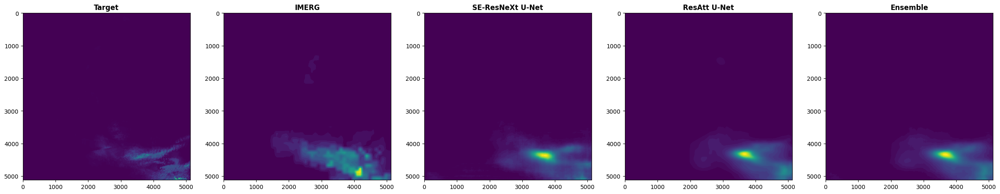

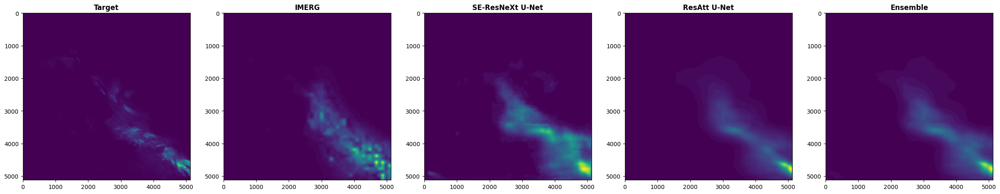

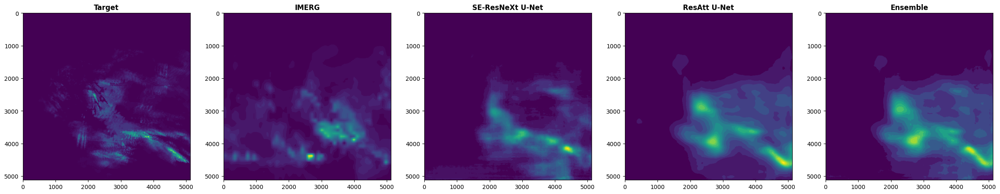

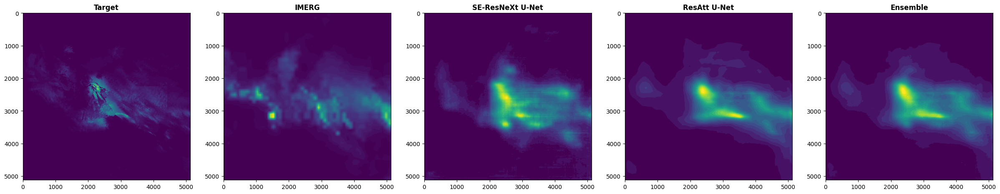

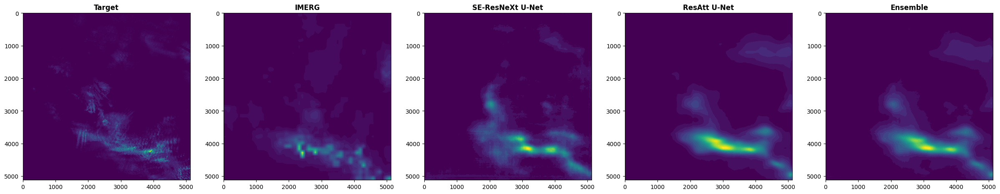

...

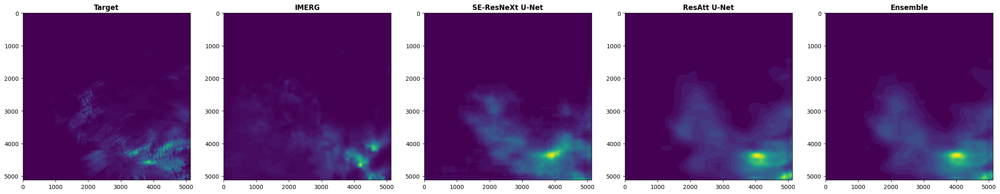

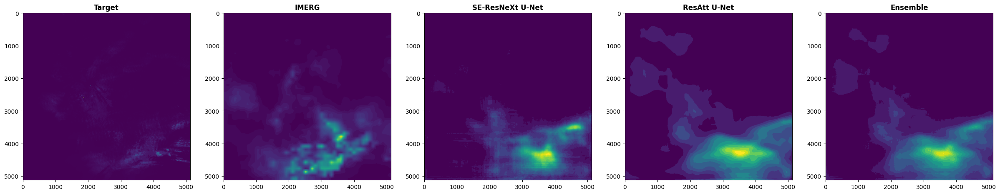

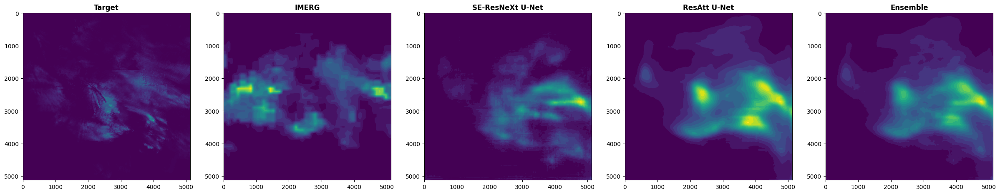

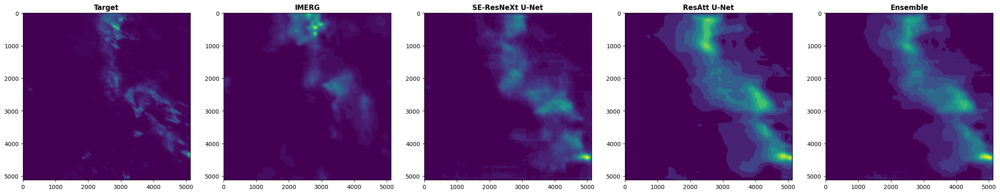

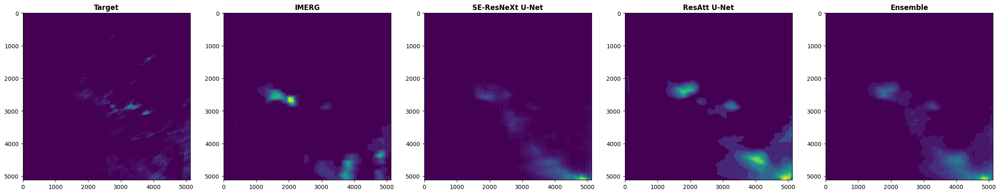

In [147]:
rasterOrigin = (-123.25745, 45.43013)
rasterOrigin_2 = (0, 0)
pixelWidth = 10
pixelHeight = 10
count = 0

for i in range(52):
  count = count + 1
  array2raster('pred_seresnext_%x.tif'%(i), rasterOrigin_2, pixelWidth, pixelHeight, torch.cat(pred1, axis=0)[i].cpu().squeeze(0).numpy())
  array2raster('target_%x.tif'%(i), rasterOrigin_2, pixelWidth, pixelHeight, target[i].cpu().squeeze(0).numpy())
  array2raster('pred_resattn_%x.tif'%(i), rasterOrigin_2, pixelWidth, pixelHeight, torch.cat(pred2, axis=0)[i].cpu().squeeze(0).numpy())
  array2raster('imerg_%x.tif'%(i), rasterOrigin_2, pixelWidth, pixelHeight, imerg_image[i].cpu().squeeze(0).numpy())
  array2raster('pred_ensemble_%x.tif'%(i), rasterOrigin_2, pixelWidth, pixelHeight, ensem_pred[i].cpu().squeeze(0).numpy())
  
  plot('target_%x.tif'%(i), 'imerg_%x.tif'%(i), 'pred_seresnext_%x.tif'%(i), 'pred_resattn_%x.tif'%(i), 'pred_ensemble_%x.tif'%(i))